**Import and Initial Data Checks**

In [1]:
import pandas as pd

In [2]:
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

In [4]:
import plotly.express as px

In [5]:
import numpy as np

In [7]:
import warnings
warnings.filterwarnings("ignore")

In [8]:
from scipy import stats

In [12]:
import pandas as pd
df=pd.read_csv("/content/AMCAT data.xlsx - Sheet1.csv")
df

,Unnamed: 0,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,train,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.30,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,train,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.40,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,train,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.00,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,train,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.60,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,train,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.00,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3993,train,47916,280000.0,10/1/11 0:00,10/1/12 0:00,software engineer,New Delhi,m,4/15/87 0:00,52.09,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3994,train,752781,100000.0,7/1/13 0:00,7/1/13 0:00,technical writer,Hyderabad,f,8/27/92 0:00,90.00,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3995,train,355888,320000.0,7/1/13 0:00,present,associate software engineer,Bangalore,m,7/3/91 0:00,81.86,...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3996,train,947111,200000.0,7/1/14 0:00,1/1/15 0:00,software developer,Asifabadbanglore,f,3/20/92 0:00,78.72,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 39 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Unnamed: 0             3998 non-null   object 
 1   ID                     3998 non-null   int64  
 2   Salary                 3998 non-null   float64
 3   DOJ                    3998 non-null   object 
 4   DOL                    3998 non-null   object 
 5   Designation            3998 non-null   object 
 6   JobCity                3998 non-null   object 
 7   Gender                 3998 non-null   object 
 8   DOB                    3998 non-null   object 
 9   10percentage           3998 non-null   float64
 10  10board                3998 non-null   object 
 11  12graduation           3998 non-null   int64  
 12  12percentage           3998 non-null   float64
 13  12board                3998 non-null   object 
 14  CollegeID              3998 non-null   int64  
 15  Coll

In [17]:
# Try to drop the column and if it doesn't exist, just ignore it
df = df.drop('Unnamed: 0',axis=1)

In [18]:
df.columns

Index(['ID', 'Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'CollegeID', 'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityID', 'CollegeCityTier', 'CollegeState', 'GraduationYear',
       'English', 'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [19]:
df.columns = df.columns.str.lower()

In [20]:
df.head()

,id,salary,doj,dol,designation,jobcity,gender,dob,10percentage,10board,...,computerscience,mechanicalengg,electricalengg,telecomengg,civilengg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,6/1/12 0:00,present,senior quality engineer,Bangalore,f,2/19/90 0:00,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,9/1/13 0:00,present,assistant manager,Indore,m,10/4/89 0:00,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,6/1/14 0:00,present,systems engineer,Chennai,f,8/3/92 0:00,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,267447,1100000.0,7/1/11 0:00,present,senior software engineer,Gurgaon,m,12/5/89 0:00,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
4,343523,200000.0,3/1/14 0:00,3/1/15 0:00,get,Manesar,m,2/27/91 0:00,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [24]:
print(df.shape)

(3998, 38)


In [25]:
print(df.describe())

                 id        salary                            doj  \
count  3.998000e+03  3.998000e+03                           3998   
mean   6.637945e+05  3.076998e+05  2013-07-02 11:04:10.325162496   
min    1.124400e+04  3.500000e+04            1991-06-01 00:00:00   
25%    3.342842e+05  1.800000e+05            2012-10-01 00:00:00   
50%    6.396000e+05  3.000000e+05            2013-11-01 00:00:00   
75%    9.904800e+05  3.700000e+05            2014-07-01 00:00:00   
max    1.298275e+06  4.000000e+06            2015-12-01 00:00:00   
std    3.632182e+05  2.127375e+05                            NaN   

       10percentage  12graduation  12percentage     collegeid  collegetier  \
count   3998.000000   3998.000000   3998.000000   3998.000000  3998.000000   
mean      77.925443   2008.087544     74.466366   5156.851426     1.925713   
min       43.000000   1995.000000     40.000000      2.000000     1.000000   
25%       71.680000   2007.000000     66.000000    494.000000     2.000000 

In [21]:
df['doj'] = pd.to_datetime(df['doj'])

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3998 entries, 0 to 3997
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   id                     3998 non-null   int64         
 1   salary                 3998 non-null   float64       
 2   doj                    3998 non-null   datetime64[ns]
 3   dol                    3998 non-null   object        
 4   designation            3998 non-null   object        
 5   jobcity                3998 non-null   object        
 6   gender                 3998 non-null   object        
 7   dob                    3998 non-null   object        
 8   10percentage           3998 non-null   float64       
 9   10board                3998 non-null   object        
 10  12graduation           3998 non-null   int64         
 11  12percentage           3998 non-null   float64       
 12  12board                3998 non-null   object        
 13  col

**Data Cleaning**

In [33]:
# Check for missing values
print(df.isnull().sum())

# Handle missing values
df.dropna(inplace=True)  # Option 1: Drop rows with missing values

# Check for duplicates
print(df.duplicated().sum())
df.drop_duplicates(inplace=True) # Call the method on the DataFrame object

# Data Type Conversion
for column in df.select_dtypes(include=['object']):
    df[column] = df[column].astype('category')

# Outlier Detection and Removal
for column in df.select_dtypes(include=['float64', 'int64']):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df = df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Normalization (if required)
!pip install scikit-learn # install scikit-learn if it's not already installed
from sklearn.preprocessing import StandardScaler # import StandardScaler from sklearn.preprocessing
scaler = StandardScaler()
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
df[numerical_cols] = scaler.fit_transform(df[numerical_cols])

# Final inspection
print(df.info())
print(df.head())

id                       0
salary                   0
doj                      0
dol                      0
designation              0
jobcity                  0
gender                   0
dob                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
collegeid                0
collegetier              0
degree                   0
specialization           0
collegegpa               0
collegecityid            0
collegecitytier          0
collegestate             0
graduationyear           0
english                  0
logical                  0
quant                    0
domain                   0
computerprogramming      0
electronicsandsemicon    0
computerscience          0
mechanicalengg           0
electricalengg           0
telecomengg              0
civilengg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

**Univariate Analysis**

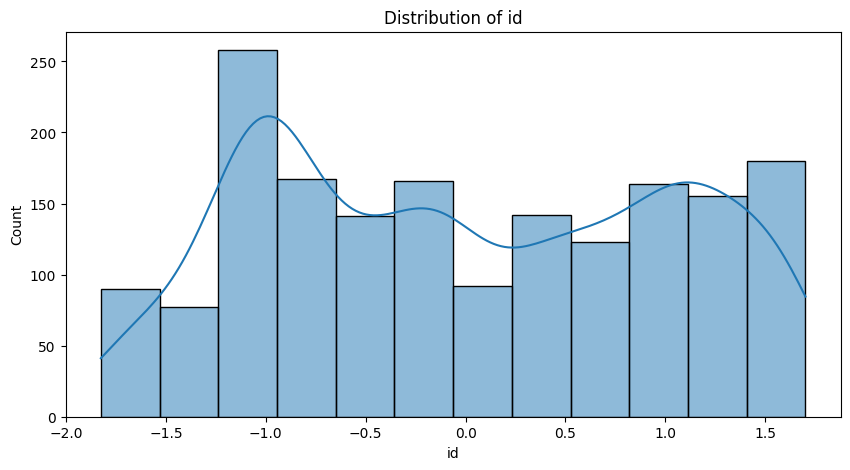

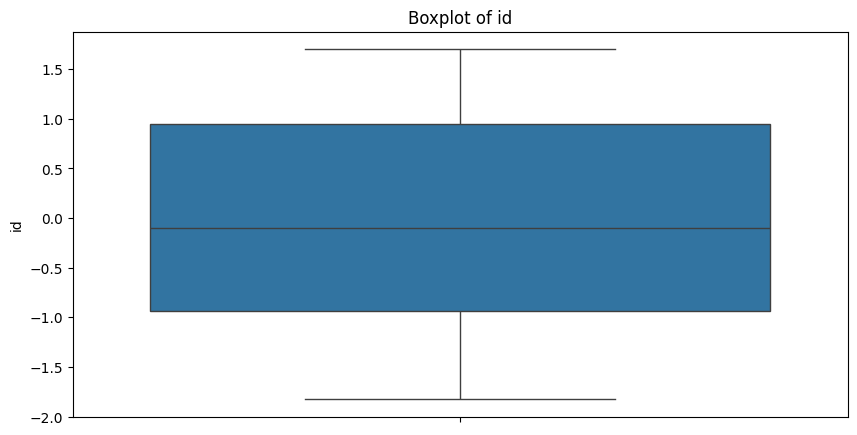

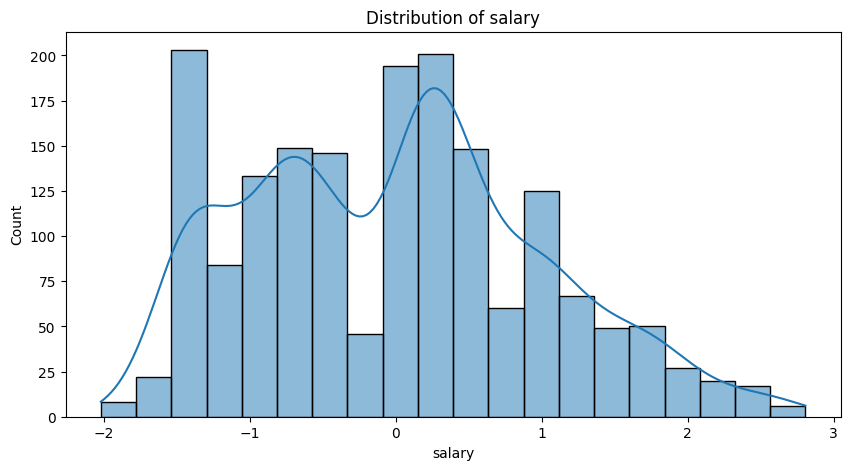

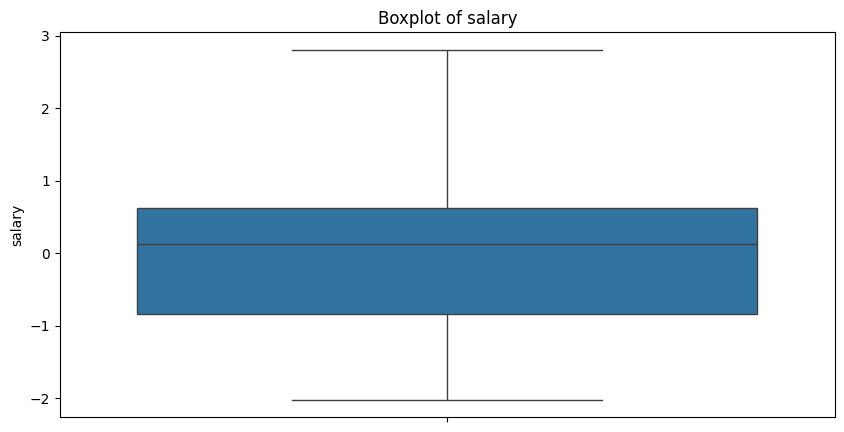

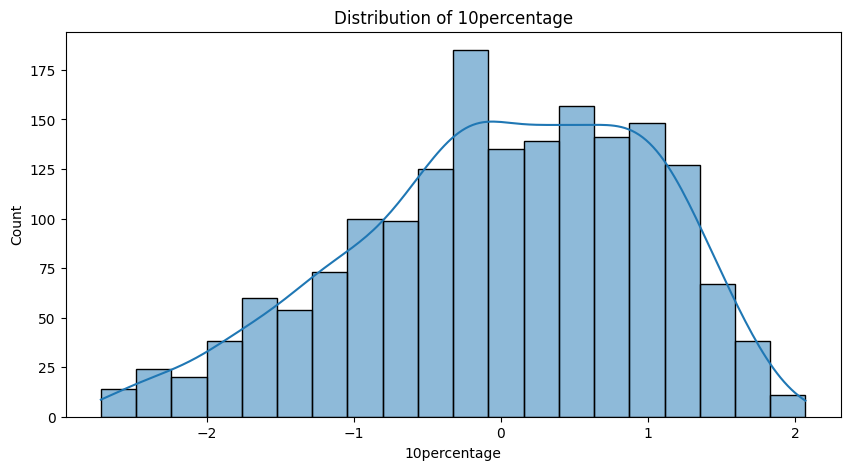

...

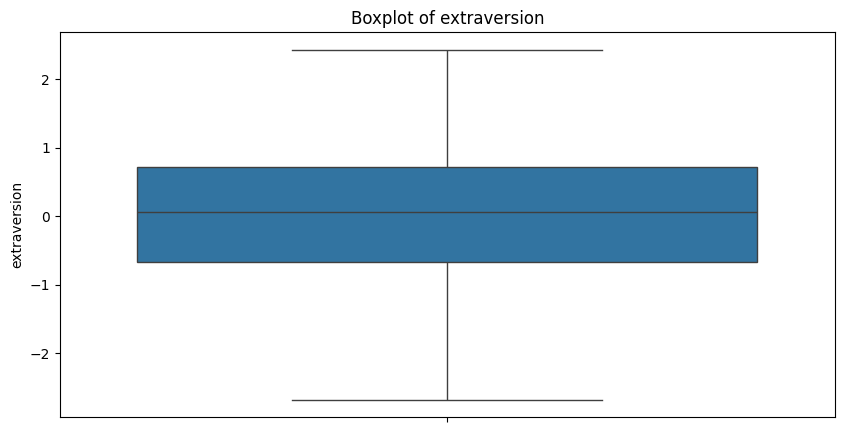

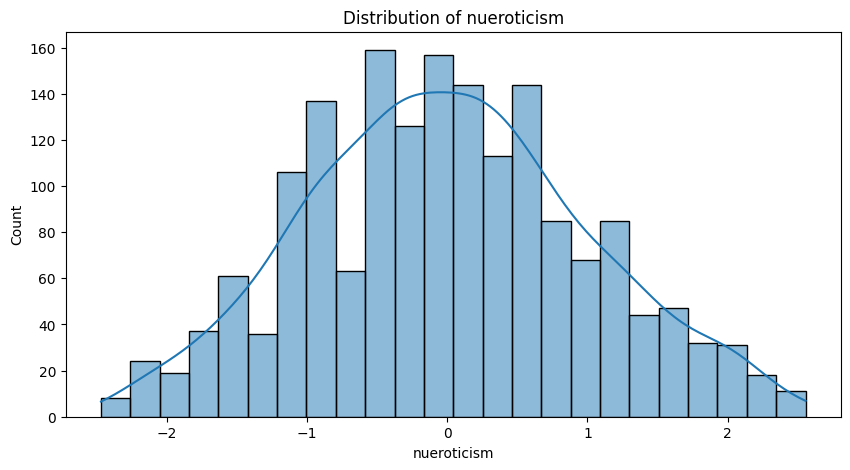

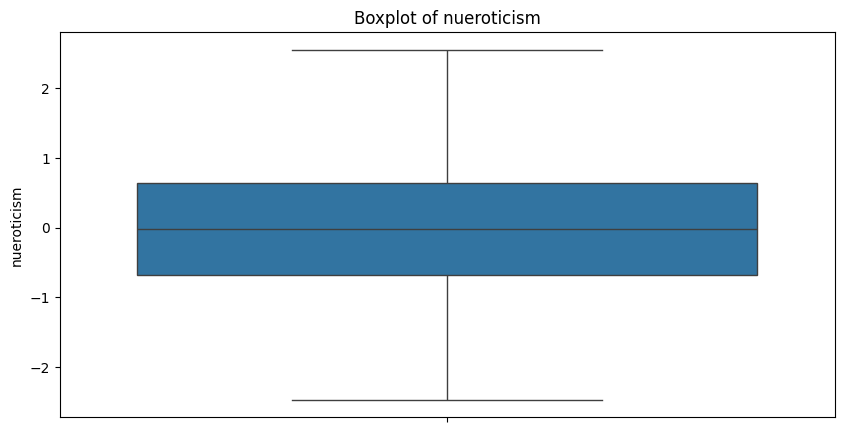

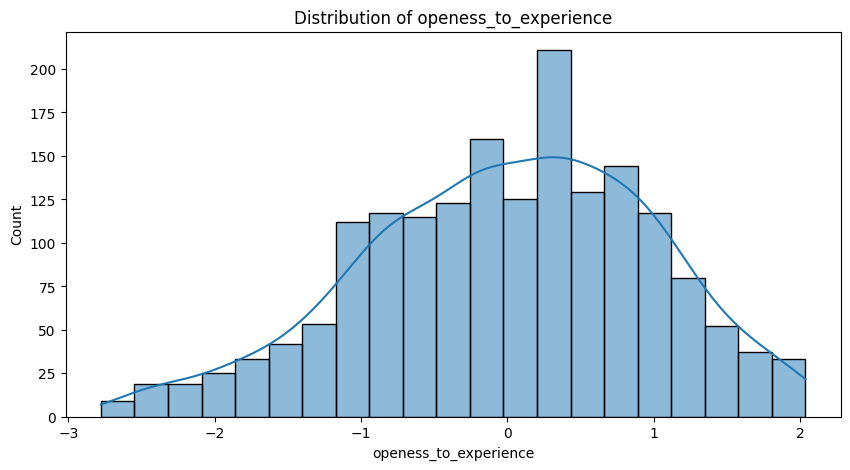

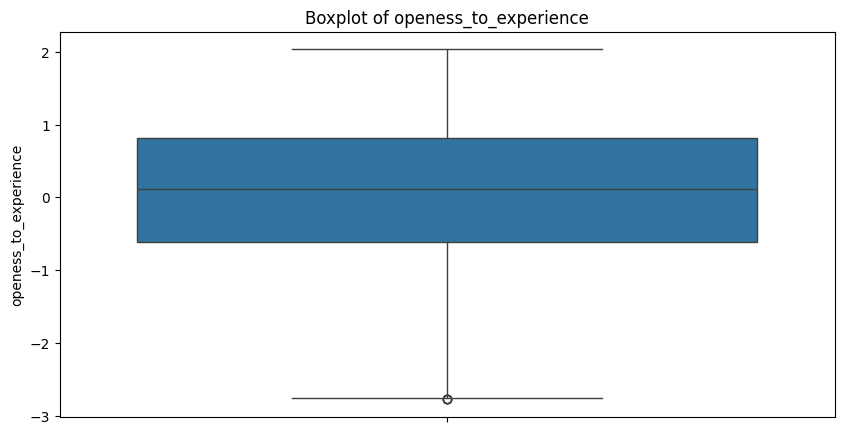

In [34]:
for column in df.select_dtypes(include=['float64', 'int64']):
    plt.figure(figsize=(10, 5))
    sns.histplot(df[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.show()

    plt.figure(figsize=(10, 5))
    sns.boxplot(df[column])
    plt.title(f'Boxplot of {column}')
    plt.show()


In [35]:
for column in df.select_dtypes(include=['float64', 'int64']):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    outliers = df[(df[column] < (Q1 - 1.5 * IQR)) | (df[column] > (Q3 + 1.5 * IQR))]
    print(f'Outliers in {column}: {outliers.shape[0]}')


Outliers in id: 0
Outliers in salary: 0
Outliers in 10percentage: 0
Outliers in 12graduation: 5
Outliers in 12percentage: 0
Outliers in collegeid: 0
Outliers in collegetier: 0
Outliers in collegegpa: 0
Outliers in collegecityid: 0
Outliers in collegecitytier: 0
Outliers in graduationyear: 0
Outliers in english: 0
Outliers in logical: 0
Outliers in quant: 4
Outliers in domain: 0
Outliers in computerprogramming: 0
Outliers in electronicsandsemicon: 0
Outliers in computerscience: 0
Outliers in mechanicalengg: 0
Outliers in electricalengg: 0
Outliers in telecomengg: 0
Outliers in civilengg: 0
Outliers in conscientiousness: 0
Outliers in agreeableness: 0
Outliers in extraversion: 0
Outliers in nueroticism: 0
Outliers in openess_to_experience: 4


In [44]:
cat_cols = df.select_dtypes(include=['object']).columns

for col in cat_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(y=df[col])
    plt.title(f'Countplot of {col}')
    plt.show()


**Bivariate Analysis**

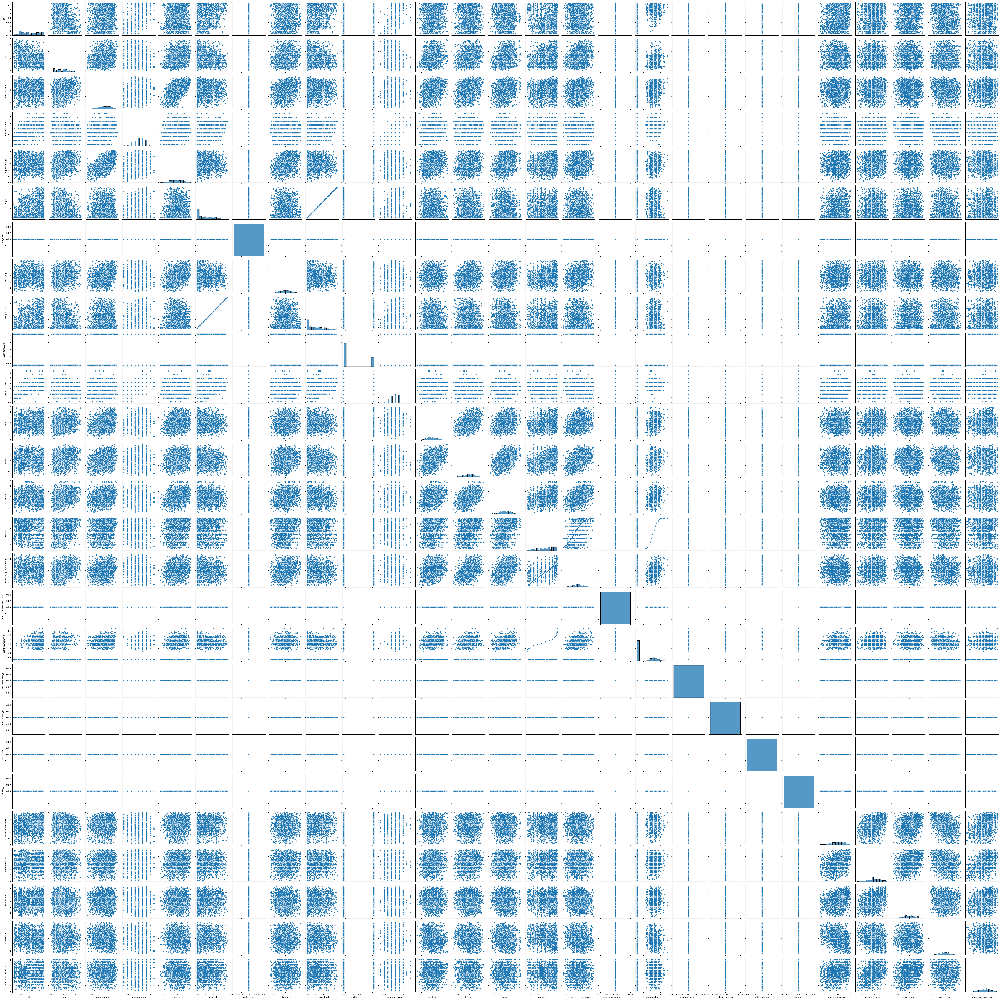

In [46]:
# Scatter plots
num_cols = df.select_dtypes(include=['float64', 'int64']).columns # Assign num_cols
sns.pairplot(df[num_cols])
plt.show()


In [47]:
# Swarmplot
for col in cat_cols:
    if col != 'Salary':  # Exclude Salary to avoid unnecessary plots
        plt.figure(figsize=(10, 6))
        sns.boxplot(x=df[col], y=df['Salary'])
        plt.title(f'Salary vs {col}')
        plt.show()

Index(['id', 'salary', 'doj', 'dol', 'designation', 'jobcity', 'gender', 'dob',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'collegeid', 'collegetier', 'degree', 'specialization', 'collegegpa',
       'collegecityid', 'collegecitytier', 'collegestate', 'graduationyear',
       'english', 'logical', 'quant', 'domain', 'computerprogramming',
       'electronicsandsemicon', 'computerscience', 'mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')


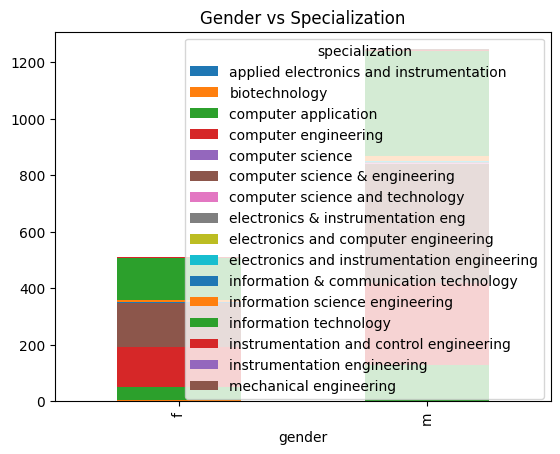

In [53]:

print(df.columns)

# Assuming the column name is actually 'specialization'
pd.crosstab(df['gender'], df['specialization']).plot(kind='bar', stacked=True)

plt.title('Gender vs Specialization')
plt.show()

In [57]:
print(df.columns)
filtered_data = df[df['designation'].isin(roles)]
average_salary = filtered_data['salary'].mean() # Changed 'Salary' to 'salary'
print(f'Average Salary for selected roles: {average_salary}')

Index(['id', 'salary', 'doj', 'dol', 'designation', 'jobcity', 'gender', 'dob',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'collegeid', 'collegetier', 'degree', 'specialization', 'collegegpa',
       'collegecityid', 'collegecitytier', 'collegestate', 'graduationyear',
       'english', 'logical', 'quant', 'domain', 'computerprogramming',
       'electronicsandsemicon', 'computerscience', 'mechanicalengg',
       'electricalengg', 'telecomengg', 'civilengg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')
Average Salary for selected roles: nan
